# Semestrální práce 2

In [43]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [44]:
import concurrent.futures
import time
import pandas as pd
from MWSATInstance import MWSATInstance
from MWSATSolution import MWSATSolution
from simulated_annealing import simulated_annealing
import matplotlib.pyplot as plt
import seaborn as sns
import os 
import numpy as np

# 1) Ukázka implementace
Implementace programové reprezentace MWSAt instancí je v souboru MWSATInstance.py. Jsou uchovávány jednodlivé klauzule a proměnné jsou reprezenovány stejně jako ve vstupním souboru. Pro efektivní práci dále třída MWSATInstance uchovává pro každou proměnnou klauzule v kterých je obsažena.

Pojďme se jen rychle podívat na reprezentaci následujícího souboru:

> c This Formular is generated by mcnf \
> c \
> c    horn? no  \
> c    forced? no  \
> c    mixed sat? no  \
> c    clause length = 3  \
> c \
> c SAT instance uf20-91/uf20-01.cnf \
> p mwcnf 20 91 \
> w 272 39 39 194 1 194 1 78 117 156 39 1 233 311 311 1 311 39 39 311 0 \
> c range 100 1500 straight \
>  4 -18 19 0 \
> 3 18 -5 0 \
> -5 -8 -15 0 \
> -20 7 -16 0 \
> 10 -13 -7 0 \
> -12 -9 17 0 \
> 17 19 5 0 \
> -16 9 15 0 \
> 11 -5 -14 0 \
> 18 -10 13 0 \
> -3 11 12 0 \
> -6 -17 -8 0 \
> -18 14 1 0 \
> -19 -15 10 0 \
> 12 18 -19 0 \
> -8 4 7 0 \
> -8 -9 4 0 \
> 7 17 -15 0 \
> 12 -7 -14 0 \
> -10 -11 8 0 \
> 2 -15 -11 0 \
> 9 6 1 0 \
> -11 20 -17 0 \
> 9 -15 13 0 \
> 12 -7 -17 0 \
> -18 -2 20 0 \
> 20 12 4 0 \
> 19 11 14 0 \
> -16 18 -4 0 \
> -1 -17 -19 0 \
> -13 15 10 0 \
> -12 -14 -13 0 \
> 12 -14 -7 0 \
> -7 16 10 0 \
> 6 10 7 0 \
> 20 14 -16 0 \
> -19 17 11 0 \
> -7 1 -20 0 \
> -5 12 15 0 \
> -4 -9 -13 0 \
> 12 -11 -7 0 \
> -5 19 -8 0 \
> 1 16 17 0 \
> 20 -14 -15 0 \
> 13 -4 10 0 \
> 14 7 10 0 \
> -5 9 20 0 \
> 10 1 -19 0 \
> -16 -15 -1 0 \
> 16 3 -11 0 \
> -15 -10 4 0 \
> 4 -15 -3 0 \
> -10 -16 11 0 \
> -8 12 -5 0 \
> 14 -6 12 0 \
> 1 6 11 0 \
> -13 -5 -1 0 \
> -7 -2 12 0 \
> 1 -20 19 0 \
> -2 -13 -8 0 \
> 15 18 4 0 \
> -11 14 9 0 \
> -6 -15 -2 0 \
> 5 -12 -15 0 \
> -6 17 5 0 \
> -13 5 -19 0 \
> 20 -1 14 0 \
> 9 -17 15 0 \
> -5 19 -18 0 \
> -12 8 -10 0 \
> -18 14 -4 0 \
> 15 -9 13 0 \
> 9 -5 -1 0 \
> 10 -19 -14 0 \
> 20 9 4 0 \
> -9 -2 19 0 \
> -5 13 -17 0 \
> 2 -10 -18 0 \
> -18 3 11 0 \
> 7 -9 17 0 \
> -15 -6 -3 0 \
> -2 3 -13 0 \
> 12 3 -2 0 \
> -2 -3 17 0 \
> 20 -15 -16 0 \
> -5 -17 -19 0 \
> -20 -18 11 0 \
> -9 1 -5 0 \
> -19 9 17 0 \
> 12 -2 17 0 \
> 4 -16 -5 0 \
 \
 \
 \
 \
 \

In [45]:
# instance_demo = MWSATInstance(os.path.join("data","wuf20-91","wuf20-91-M","wuf20-01.mwcnf"))
instance_demo = MWSATInstance(os.path.join("test.mwcnf"))
print("Number of variables: ", instance_demo.num_vars)
print("First clause: ", instance_demo.clauses[0])
print("Clauses for variable 1: ", instance_demo.get_clauses_for_var(1))

print("Weight for variable 1: ", instance_demo.get_weight_for_variable(1))
print("Weight for variable 2: ", instance_demo.get_weight_for_variable(2))
print("Weight for variable 3: ", instance_demo.get_weight_for_variable(3))

print("Max-weight: ", instance_demo.max_single_weight)
print("Eval for [1,1,1]: ", instance_demo.evaluate([1,1,1]))
print("Eval for [1,0,1]: ", instance_demo.evaluate([1,0,1]))

print("Satisfied literals in clause 1, variables [1,1,1]: ", instance_demo.get_satisfied_vars_in_clause_count(instance_demo.clauses[0],[1,1,1]))

Number of variables:  3
First clause:  (1, -2, 3)
Clauses for variable 1:  [(1, -2, 3)]
Weight for variable 1:  272
Weight for variable 2:  39
Weight for variable 3:  39
Max-weight:  272
Eval for [1,1,1]:  (350, 1.2867647058823528, True)
Eval for [1,0,1]:  (311, 1.1433823529411764, True)
Satisfied literals in clause 1, variables [1,1,1]:  2


In [46]:
solution = MWSATSolution(instance_demo)

print("Clauses: ", solution.instance.clauses)
print("Solution var values: ", solution.variable_values)
print("Solution score: ", solution.current_score)
print("Solution clauses satisfied", solution.clauses_satisfied)
print("-------Solution flip 1----- ")
solution.update_variable_and_score(1)
print("Solution var values after: ", solution.variable_values)
print("Solution score after: ", solution.current_score)
print("Solution clauses satisfied after: ", solution.clauses_satisfied)

Clauses:  [(1, -2, 3)]
Solution var values:  [0, 0, 0]
Solution score:  0
Solution clauses satisfied 1
-------Solution flip 1----- 
Solution var values after:  [1, 0, 0]
Solution score after:  272
Solution clauses satisfied after:  1


In [47]:
instance1 = MWSATInstance(os.path.join("data","wuf50-218","wuf50-218-M","wuf50-02.mwcnf"),penalty_violation_factor=3)
# result_solution, history_clauses_sat, history_raw_score = simulated_annealing(instance1,1000,0.05,100,0.01)
result_solution, history = simulated_annealing(instance1,1000,0.95,100,max_steps_without_improvement=10000,fitness_coefficient=1)
print(result_solution.variable_values)
print(result_solution.clauses_satisfied)
print(result_solution.current_score)

[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1]
218
24366


# 2) Whitebox fáze
- Cílem této fáze bude nastavit parametry na omezené sadě instancí
- My budeme používat sadu wuf50-218 a z ní první 4 instance 

In [48]:
from helper import evaluate_algorithm_performance,plot_algorithm_run,get_solution_dict, evaluate_param_tuning_no_plot

In [49]:
wuf_50_m_path = os.path.join("data","wuf50-218", "wuf50-218-M")
wuf_50_n_path = os.path.join("data","wuf50-218", "wuf50-218-N")
wuf_50_q_path = os.path.join("data","wuf50-218", "wuf50-218-Q")
wuf_50_r_path = os.path.join("data","wuf50-218", "wuf50-218-R")
wuf_50_path = os.path.join("data","wuf50-218")

wuf_20_r_path = os.path.join("data","wuf20-91", "wuf20-91-R")
wuf_20_n_path = os.path.join("data","wuf20-91", "wuf20-91-N")
wuf_20_q_path = os.path.join("data","wuf20-91", "wuf20-91-Q")
wuf_20_m_path = os.path.join("data","wuf20-91", "wuf20-91-M")
wuf_20_path = os.path.join("data","wuf20-91")

wuf_75_r_path = os.path.join("data","wuf75-325", "wuf75-325-R")
wuf_75_m_path = os.path.join("data","wuf75-325", "wuf75-325-M")
wuf_75_q_path = os.path.join("data","wuf75-325", "wuf75-325-Q")
wuf_75_n_path = os.path.join("data","wuf75-325", "wuf75-325-N")
wuf_75_path = os.path.join("data","wuf75-325")

instance_paths = [os.path.join(wuf_50_r_path,x) for x in os.listdir(wuf_50_r_path)[:10]]
solutions_wuf_50_r = get_solution_dict(os.path.join(wuf_50_path,"wuf50-218-R-opt.dat"))

Prvním krokem v White box fáze bude nastavení počáteční teploty. Využijeme vzorec z přdnášky 
$$
T_0 = \frac{\delta}{\ln P_0}
$$

kde $\delta$ je hlouba lokálního optima a $P$ je pravděpodobnost útěku z tohoto optima na počátku. Parametr delta lze spočítat jako průměrnou hloubku lokálních optim a parametr P budeme volit jako hyperparametr.

Pro získání $\delta$ mám upravenou verzi algoritmu simulated_annealing, která ukládá hodnoty při zhoršení. Necháme algoritmus běžet s nekonečnou teplotou, tak aby byla explorace prostoru maximální a zjistili jsme průměrnou hloubku lokálních optim. 

Pro klaždý druh generování vah budou optima mít různé hodnoty takže je budeme muset měřit zvlášť. 

# 2.1) Baseline konfigurace
- Je potřeba vytvořit si nějakou kombinaci parametrů, který funguje "dobře" na zkoumaných instancích
- Od této konfigurace se potom odpíchneme a budeme ladit jednotlivé parametry samostatně

--- Starting Baseline configuration on 50 variable instances (100 total runs) ---
Params: {'P0': 0.9, 'cooling_coefficient': 0.9, 'equilibrium_steps': 3, 'max_steps_without_improvement': 300, 'fitness_coefficient': 100, 'random_flip': True}
Processing Instance 1/10: wuf50-0323.mwcnf
Processing Instance 2/10: wuf50-0366.mwcnf
Processing Instance 3/10: wuf50-069.mwcnf
Processing Instance 4/10: wuf50-094.mwcnf
Processing Instance 5/10: wuf50-0861.mwcnf
Processing Instance 6/10: wuf50-0824.mwcnf
Processing Instance 7/10: wuf50-0657.mwcnf
Processing Instance 8/10: wuf50-0286.mwcnf
Processing Instance 9/10: wuf50-0612.mwcnf
Processing Instance 10/10: wuf50-0939.mwcnf


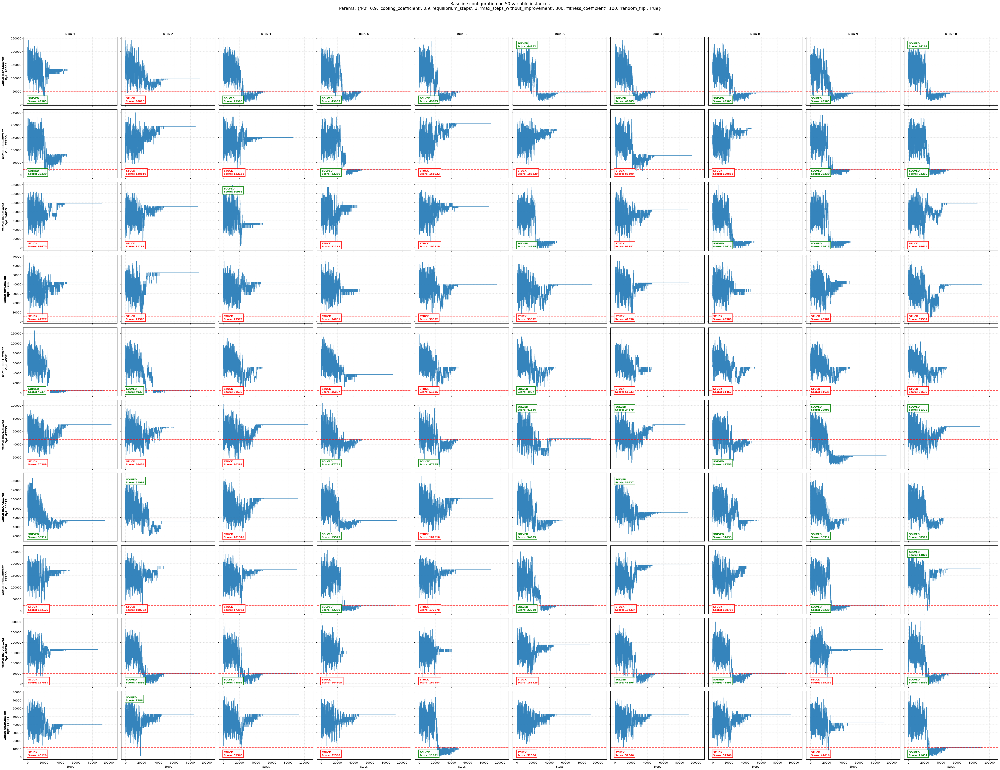


Instance                  | Runs | Solved | Optimal | Avg Score  | % of Opt | Avg Steps
-----------------------------------------------------------------------------------------------
wuf50-0323.mwcnf          | 10   | 9      | 7       | 48697.7    | 97.42 %  | 91690.8  
wuf50-0366.mwcnf          | 10   | 4      | 4       | 22230.0    | 100.00%  | 89990.4  
wuf50-069.mwcnf           | 10   | 4      | 3       | 13703.2    | 93.76 %  | 88093.8  
wuf50-094.mwcnf           | 10   | 0      | 0       | 0.0        | 0.00  %  | 91821.6  
wuf50-0861.mwcnf          | 10   | 3      | 3       | 4937.0     | 100.00%  | 92671.8  
wuf50-0824.mwcnf          | 10   | 7      | 3       | 37649.3    | 78.84 %  | 94633.8  
wuf50-0657.mwcnf          | 10   | 8      | 3       | 53769.1    | 91.27 %  | 94372.2  
wuf50-0286.mwcnf          | 10   | 4      | 3       | 20379.2    | 91.67 %  | 93260.4  
wuf50-0612.mwcnf          | 10   | 5      | 5       | 48896.0    | 100.00%  | 89271.0  
wuf50-0939.mwcnf       

In [50]:
baseline_P0 = 0.9
baseline_cooling_coeff = 0.9
baseline_equilibrium_steps = 3 # Using the new coefficient (6 * 50 = 300)
baseline_max_steps_without_improvement = 300
baseline_fitness_coefficient = 100

PARAMS = {
    "P0": baseline_P0,
    "cooling_coefficient": baseline_cooling_coeff,
    "equilibrium_steps": baseline_equilibrium_steps,
    "max_steps_without_improvement": baseline_max_steps_without_improvement,
    "fitness_coefficient": baseline_fitness_coefficient,
    "random_flip": True
}
results = evaluate_algorithm_performance(instance_paths[:10],solutions_wuf_50_r,PARAMS,10,"Baseline configuration on 50 variable instances")

<Axes: title={'center': 'wuf50-0366.mwcnf'}, xlabel='Steps', ylabel='Score'>

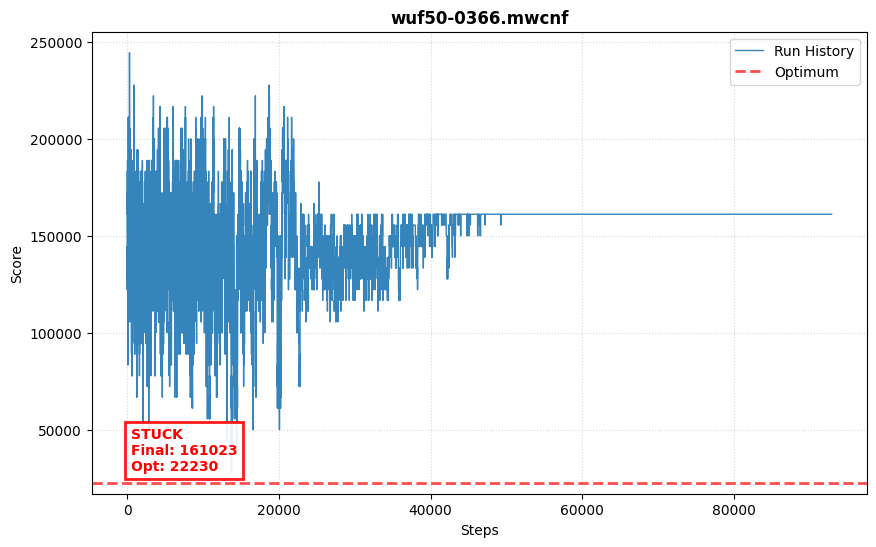

In [51]:
instance = MWSATInstance(instance_paths[1])
plot_algorithm_run(instance,solutions_wuf_50_r,PARAMS)

# Zlepší jinej random flip výkon baseline konfigurace

--- Starting Baseline configuration on 50 variable instances (100 total runs) ---
Params: {'P0': 0.9, 'cooling_coefficient': 0.9, 'equilibrium_steps': 3, 'max_steps_without_improvement': 300, 'fitness_coefficient': 100, 'random_flip': False}
Processing Instance 1/10: wuf50-0323.mwcnf
Processing Instance 2/10: wuf50-0366.mwcnf
Processing Instance 3/10: wuf50-069.mwcnf
Processing Instance 4/10: wuf50-094.mwcnf
Processing Instance 5/10: wuf50-0861.mwcnf
Processing Instance 6/10: wuf50-0824.mwcnf
Processing Instance 7/10: wuf50-0657.mwcnf
Processing Instance 8/10: wuf50-0286.mwcnf
Processing Instance 9/10: wuf50-0612.mwcnf
Processing Instance 10/10: wuf50-0939.mwcnf


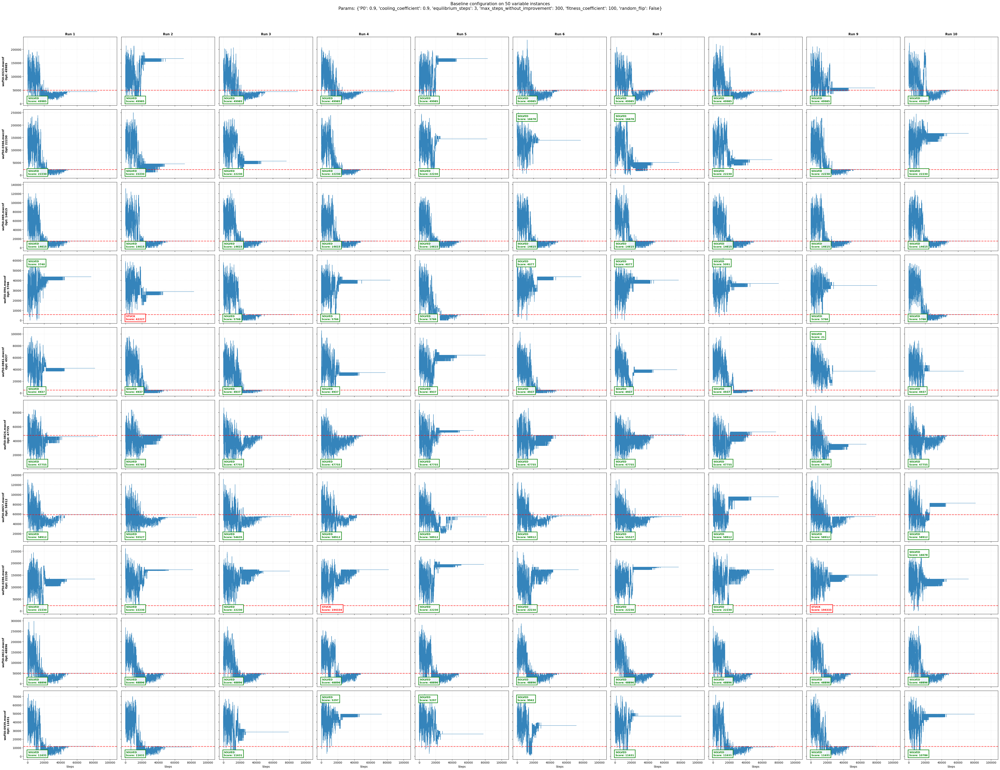


Instance                  | Runs | Solved | Optimal | Avg Score  | % of Opt | Avg Steps
-----------------------------------------------------------------------------------------------
wuf50-0323.mwcnf          | 10   | 10     | 10      | 49985.0    | 100.00%  | 82534.8  
wuf50-0366.mwcnf          | 10   | 10     | 8       | 21119.6    | 95.00 %  | 76910.4  
wuf50-069.mwcnf           | 10   | 10     | 10      | 14615.0    | 100.00%  | 79199.4  
wuf50-094.mwcnf           | 10   | 9      | 5       | 5090.6     | 88.29 %  | 80572.8  
wuf50-0861.mwcnf          | 10   | 10     | 9       | 4445.4     | 90.04 %  | 77368.2  
wuf50-0824.mwcnf          | 10   | 10     | 8       | 47361.0    | 99.17 %  | 80115.0  
wuf50-0657.mwcnf          | 10   | 10     | 7       | 57807.3    | 98.12 %  | 83515.8  
wuf50-0286.mwcnf          | 10   | 8      | 7       | 21536.0    | 96.88 %  | 78349.2  
wuf50-0612.mwcnf          | 10   | 10     | 10      | 48896.0    | 100.00%  | 80442.0  
wuf50-0939.mwcnf       

In [52]:
PARAMS = {
    "P0": baseline_P0,
    "cooling_coefficient": baseline_cooling_coeff,
    "equilibrium_steps": baseline_equilibrium_steps,
    "max_steps_without_improvement": baseline_max_steps_without_improvement,
    "fitness_coefficient": baseline_fitness_coefficient,
    "random_flip": False
}
results = evaluate_algorithm_performance(instance_paths[:10],solutions_wuf_50_r,PARAMS,10,"Baseline configuration on 50 variable instances")

# 2.2 Nastavení Fitness coefficient
Nastavení fitness  velmi ovlivňuje celý algoritmus, zejména míru toho jak moc jsou přijímány horší řešení.

In [53]:
from helper import run_tuning_experiment

--- Tuning 'fitness_coefficient' on wuf50-0323.mwcnf (9 total runs) ---
Testing fitness_coefficient = 10...
Testing fitness_coefficient = 50...
Testing fitness_coefficient = 100...


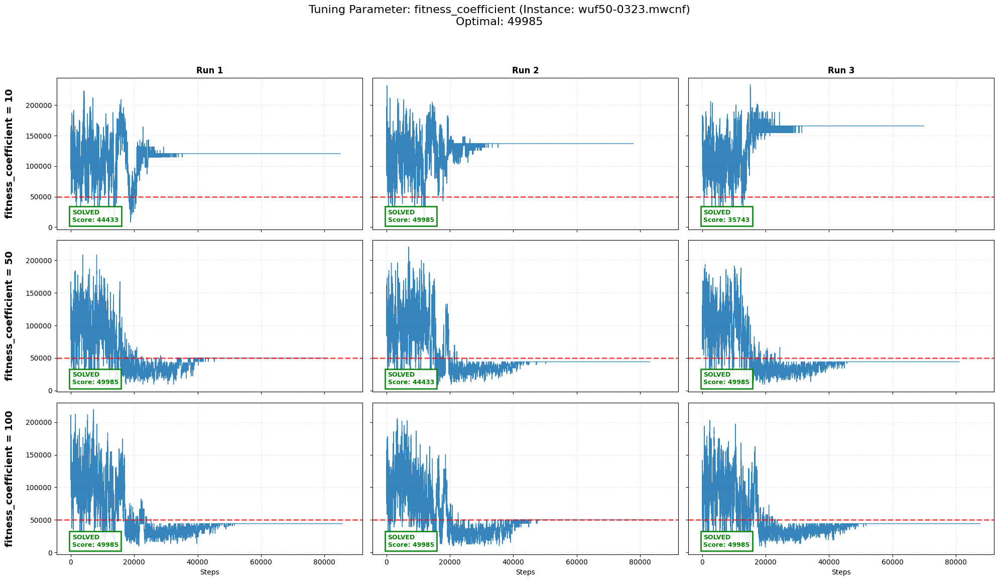


fitness_coefficient | Runs | Solved | Optimal | Avg Score  | % of Opt | Avg Steps
-----------------------------------------------------------------------------------------------
10              | 3    | 3      | 1       | 43387.0    | 86.80 %  | 77608.0  
50              | 3    | 3      | 2       | 48134.3    | 96.30 %  | 81532.0  
100             | 3    | 3      | 3       | 49985.0    | 100.00%  | 86546.0  

--- Tuning Parameter: 'fitness_coefficient' (Across 10 instances) ---

 fitness_coefficient | Runs   | Solved   | Optimal  | Avg % Opt    | Avg Steps 
------------------------------------------------------------------------------------------
 10              | 40     | 29       | 14       | 85.82        | 78872.4   
 20              | 40     | 35       | 19       | 86.75        | 78970.5   
 50              | 40     | 40       | 30       | 95.21        | 79689.9   
 100             | 40     | 40       | 32       | 96.00        | 78594.4   
 150             | 40     | 39       | 3

In [54]:
base_params = {
    "cooling_coefficient": baseline_cooling_coeff,
    "equilibrium_steps": baseline_equilibrium_steps,
    "max_steps_without_improvement": baseline_max_steps_without_improvement,
    "P0": baseline_P0
}

target_path = instance_paths[0]
filename = os.path.basename(target_path)
key = filename.split(".")[0]
opt_weight = solutions_wuf_50_r.get(key, 0)

run_tuning_experiment(
    base_params=base_params,
    param_name="fitness_coefficient",
    param_values=[10,50,100],
    instance_path=target_path,
    optimal_weight=opt_weight,
    n_runs=3
)

results = evaluate_param_tuning_no_plot(instance_paths[:10], solutions_wuf_50_r,base_params,"fitness_coefficient",[10,20,50,100,150,200])

In [55]:
best_fitness_coeff_param = 100

# 2.3) Nastavení `P0`
- Jak dlouho budeme explorovat na začátku

--- Tuning 'P0' on wuf50-069.mwcnf (6 total runs) ---
Testing P0 = 0.6...
Testing P0 = 0.8...


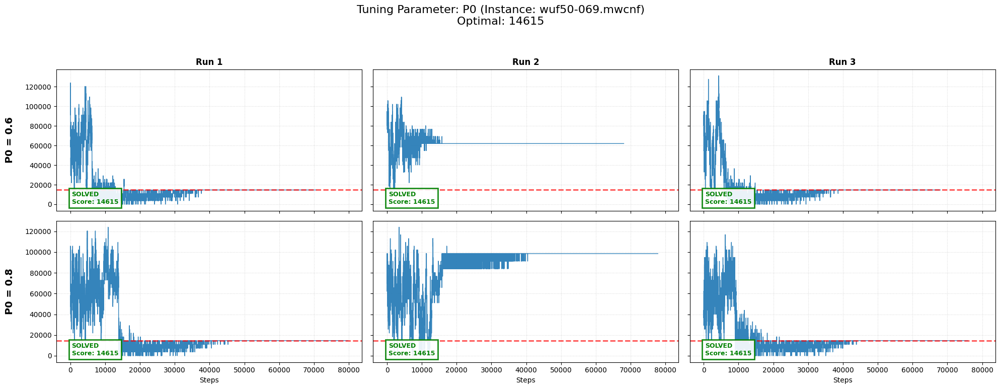


P0              | Runs | Solved | Optimal | Avg Score  | % of Opt | Avg Steps
-----------------------------------------------------------------------------------------------
0.6             | 3    | 3      | 3       | 14615.0    | 100.00%  | 68888.0  
0.8             | 3    | 3      | 3       | 14615.0    | 100.00%  | 77826.0  

--- Tuning Parameter: 'P0' (Across 10 instances) ---

 P0              | Runs   | Solved   | Optimal  | Avg % Opt    | Avg Steps 
------------------------------------------------------------------------------------------
 0.6             | 40     | 39       | 32       | 93.21        | 70942.6   
 0.7             | 40     | 39       | 31       | 94.95        | 73149.9   
 0.8             | 40     | 39       | 31       | 95.34        | 76452.6   
 0.85            | 40     | 40       | 31       | 96.65        | 77106.6   
 0.9             | 40     | 37       | 34       | 97.35        | 80540.1   


In [56]:
base_params = {
    "equilibrium_steps": baseline_equilibrium_steps,
    "max_steps_without_improvement": baseline_max_steps_without_improvement,
    "fitness_coefficient": best_fitness_coeff_param,
    "cooling_coefficient": baseline_cooling_coeff
}

target_path = instance_paths[2]
filename = os.path.basename(target_path)
key = filename.split(".")[0]
opt_weight = solutions_wuf_50_r.get(key, 0)

run_tuning_experiment(
    base_params=base_params,
    param_name="P0",
    param_values=[0.6,0.8],
    instance_path=target_path,
    optimal_weight=opt_weight,
    n_runs=3
)

results = evaluate_param_tuning_no_plot(instance_paths[:10], solutions_wuf_50_r,base_params,"P0",[0.6,0.7,0.8,0.85,0.9])

In [57]:
best_p0_param = 0.8

In [58]:
PARAMS = base_params.copy()
PARAMS["P0"] = best_p0_param


# Grid to test
cooling_values = [0.95, 0.99, 0.995, 0.999]
# Note: These are coefficients (e.g., 4 means 4*N steps)
steps_values = [1, 3,4, 6]

# Robustness settings
target_instances = instance_paths[:10]  # First 10 instances
n_runs_per_instance = 3                 # Runs per instance (Total runs = 10 * 3 = 30 per combo)


print(f"--- Global Grid Search (Total {len(target_instances) * n_runs_per_instance} runs per combo) ---")
print(f"Instances: {len(target_instances)}")
print(f"{'Cooling':<8} | {'Steps':<6} | {'Global Success':<15} | {'Global Avg Score':<16} | {'Total Steps':<12}")
print("-" * 80)

# --- Main Loops (Grid Search) ---
for alpha in cooling_values:
    for steps in steps_values:
        
        # 1. Update Parameters for this Grid Cell
        current_params = PARAMS.copy()
        current_params["cooling_coefficient"] = alpha
        current_params["equilibrium_steps"] = steps # Ensure this key matches your function
        
        # Aggregators for this specific parameter combination
        total_runs_global = 0
        total_solved_global = 0
        total_score_sum = 0
        total_steps_sum = 0
        
        # 2. Loop through ALL Target Instances
        for path in target_instances:
            filename = os.path.basename(path)
            # Find optimum for this specific instance
            key = filename.split(".")[0]
            # Use appropriate dictionary (m=medium/hard, r=random/easy?)
            # Assuming solutions_wuf_50_m is your main dict
            optimal_weight = solutions_wuf_50_r.get(key, 0) 
            
            instance = MWSATInstance(path)

            # 3. Run Repetitions
            for _ in range(n_runs_per_instance):
                best_state, history = simulated_annealing(instance, **current_params)
                
                # Check metrics
                is_valid = (best_state.clauses_satisfied == instance.num_clauses)
                
                # Update sums
                total_runs_global += 1
                total_steps_sum += len(history)
                
                if is_valid:
                    total_solved_global += 1
                    total_score_sum += best_state.current_score
                else:
                    # Penalize invalid runs with 0 score
                    total_score_sum += 0
        
        # 4. Calculate Global Averages for this Combo
        global_success_rate = (total_solved_global / total_runs_global) * 100
        global_avg_score = total_score_sum / total_runs_global
        global_avg_steps = total_steps_sum / total_runs_global


        # 5. Print Result Row
        print(f"{alpha:<8} | {steps:<6} | {global_success_rate:>13.1f}%  | {global_avg_score:>16.1f} | {int(global_avg_steps):<12}")


--- Global Grid Search (Total 30 runs per combo) ---
Instances: 10
Cooling  | Steps  | Global Success  | Global Avg Score | Total Steps 
--------------------------------------------------------------------------------
0.95     | 1      |          83.3%  |          25018.9 | 69251       
0.95     | 3      |         100.0%  |          28343.3 | 82643       
0.95     | 4      |         100.0%  |          28594.4 | 89002       
0.95     | 6      |         100.0%  |          28695.7 | 93391       
0.99     | 1      |          96.7%  |          26903.1 | 90869       
0.99     | 3      |          96.7%  |          26948.9 | 105533      
0.99     | 4      |         100.0%  |          28080.3 | 109872      
0.99     | 6      |          96.7%  |          26301.5 | 100192      
0.995    | 1      |         100.0%  |          28630.0 | 99364       
0.995    | 3      |         100.0%  |          27459.6 | 94830       
0.995    | 4      |          96.7%  |          25707.8 | 99727       
0.995    | 6

# 2.4) Nastavení `cooling coeefficient`

--- Tuning 'cooling_coefficient' on wuf50-069.mwcnf (25 total runs) ---
Testing cooling_coefficient = 0.95...
Testing cooling_coefficient = 0.99...
Testing cooling_coefficient = 0.995...
Testing cooling_coefficient = 0.999...
Testing cooling_coefficient = 0.9995...


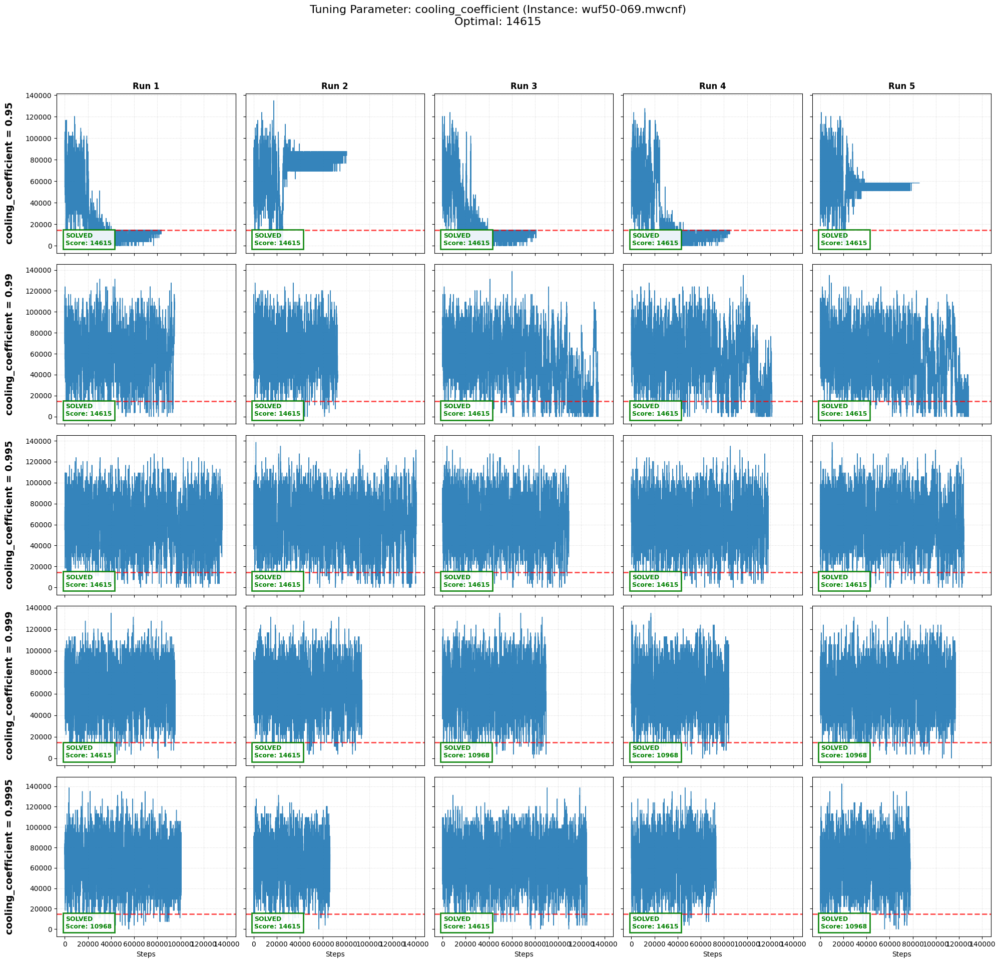


cooling_coefficient | Runs | Solved | Optimal | Avg Score  | % of Opt | Avg Steps
-----------------------------------------------------------------------------------------------
0.95            | 5    | 5      | 5       | 14615.0    | 100.00%  | 83188.8  
0.99            | 5    | 5      | 5       | 14615.0    | 100.00%  | 110395.2 
0.995           | 5    | 5      | 5       | 14615.0    | 100.00%  | 125698.8 
0.999           | 5    | 5      | 2       | 12426.8    | 85.03 %  | 96007.2  
0.9995          | 5    | 5      | 3       | 13156.2    | 90.02 %  | 88551.6  


In [59]:
base_params = {
    "equilibrium_steps": baseline_equilibrium_steps,
    "max_steps_without_improvement": baseline_max_steps_without_improvement,
    "fitness_coefficient": best_fitness_coeff_param,
    "P0": best_p0_param
}

target_path = instance_paths[2]
filename = os.path.basename(target_path)
key = filename.split(".")[0]
opt_weight = solutions_wuf_50_r.get(key, 0)

run_tuning_experiment(
    base_params=base_params,
    param_name="cooling_coefficient",
    param_values=[0.95, 0.99,0.995, 0.999,0.9995],
    instance_path=target_path,
    optimal_weight=opt_weight,
    n_runs=5
)

In [60]:
best_cooling_coeff = 0.95

# 2.5) `Equilibrium_steps`
- je to parametr úzce spjatý s rychlostí chlazení, takže bude dávat smysl ho nastavit hned jako následující

--- Tuning 'equilibrium_steps' on wuf50-069.mwcnf (25 total runs) ---
Testing equilibrium_steps = 1...
Testing equilibrium_steps = 3...
Testing equilibrium_steps = 4...
Testing equilibrium_steps = 6...
Testing equilibrium_steps = 8...


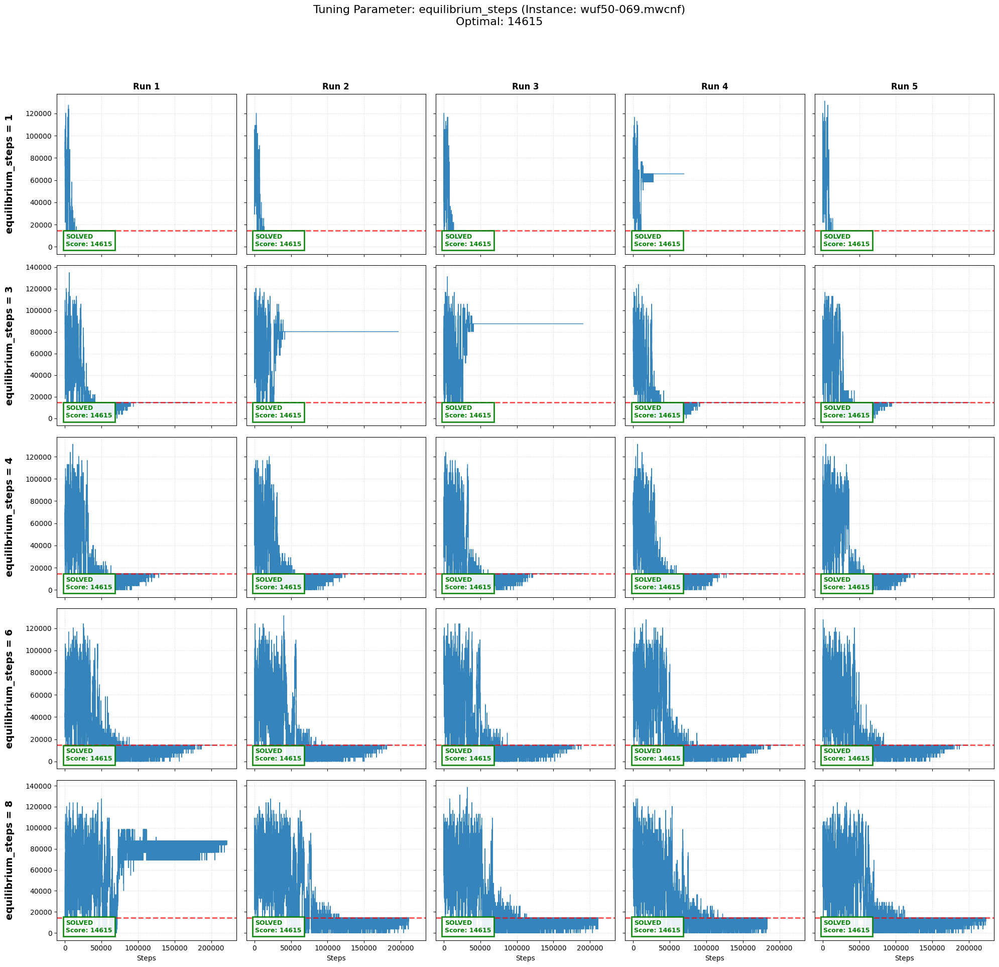


equilibrium_steps | Runs | Solved | Optimal | Avg Score  | % of Opt | Avg Steps
-----------------------------------------------------------------------------------------------
1               | 5    | 5      | 5       | 14615.0    | 100.00%  | 69324.0  
3               | 5    | 5      | 5       | 14615.0    | 100.00%  | 191360.4 
4               | 5    | 5      | 5       | 14615.0    | 100.00%  | 194456.0 
6               | 5    | 5      | 5       | 14615.0    | 100.00%  | 199339.2 
8               | 5    | 5      | 5       | 14615.0    | 100.00%  | 209977.6 


In [61]:
base_params = {
    "cooling_coefficient": best_cooling_coeff,
    "max_steps_without_improvement": 800,
    "fitness_coefficient": best_fitness_coeff_param,
    "P0": best_p0_param,    
}

target_path = instance_paths[2]
filename = os.path.basename(target_path)
key = filename.split(".")[0]
opt_weight = solutions_wuf_50_r.get(key, 0)

run_tuning_experiment(
    base_params=base_params,
    param_name="equilibrium_steps",
    param_values=[1,3,4,6,8],
    instance_path=target_path,
    optimal_weight=opt_weight,
    n_runs=5
)

In [62]:
best_equilibrium_steps = 6

In [64]:
# base_params = {
#     "cooling_coefficient": best_cooling_coeff,
#     "fitness_coefficient": best_fitness_coeff_param,
#     "equilibrium_steps": best_equilibrium_steps,
#     "P0": best_p0_param
# }

# results = evaluate_algorithm_performance(instance_paths[:2],solutions_wuf_50_r,base_params,3)

# 2.6) `max_steps_without_improvement`

--- Tuning 'max_steps_without_improvement' on wuf50-010.mwcnf (6 total runs) ---
Testing max_steps_without_improvement = 300...
Testing max_steps_without_improvement = 800...


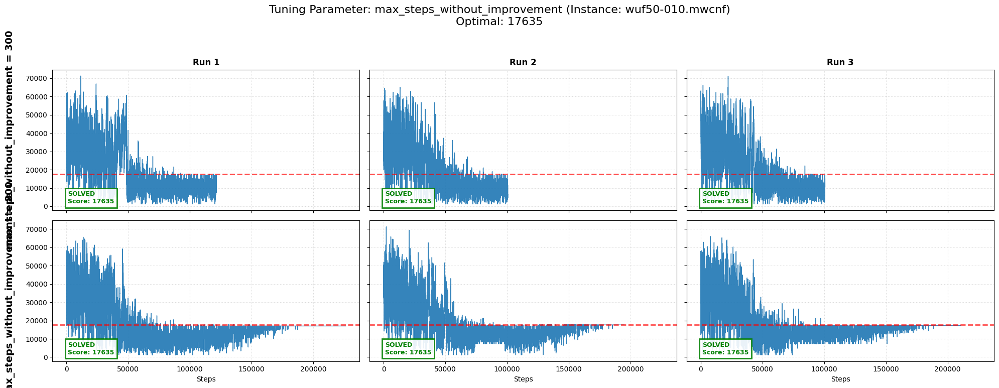


max_steps_without_improvement | Runs | Solved | Optimal | Avg Score  | % of Opt | Avg Steps
-----------------------------------------------------------------------------------------------
300             | 3    | 3      | 3       | 17635.0    | 100.00%  | 107692.0 
800             | 3    | 3      | 3       | 17635.0    | 100.00%  | 210588.0 

--- Tuning Parameter: 'max_steps_without_improvement' (Across 10 instances) ---

 max_steps_without_improvement | Runs   | Solved   | Optimal  | Avg % Opt    | Avg Steps 
------------------------------------------------------------------------------------------
 200             | 40     | 40       | 38       | 99.66        | 72888.3   
 300             | 40     | 40       | 39       | 100.00       | 94928.1   
 600             | 40     | 40       | 40       | 100.00       | 158268.0  
 800             | 40     | 40       | 39       | 99.87        | 205552.2  
 1200            | 40     | 40       | 38       | 99.69        | 290735.7  


In [ ]:
base_params = {
    "cooling_coefficient": best_cooling_coeff,
    "fitness_coefficient": best_fitness_coeff_param,
    "equilibrium_steps": best_equilibrium_steps,
    "P0": best_p0_param
}

target_path = instance_paths[1]
filename = os.path.basename(target_path)
key = filename.split(".")[0]
opt_weight = solutions_wuf_50_r.get(key, 0)

run_tuning_experiment(
    base_params=base_params,
    param_name="max_steps_without_improvement",
    param_values=[300,800],
    instance_path=target_path,
    optimal_weight=opt_weight,
    n_runs=3
)

results = evaluate_param_tuning_no_plot(instance_paths[:10], solutions_wuf_50_r,base_params,"max_steps_without_improvement",[200,300,600,800,1200])

In [ ]:
best_max_steps_without_improvement = 800

In [65]:
FINAL_CONFIG = {
    "P0": best_p0_param, 
    "cooling_coefficient": best_cooling_coeff,
    "equilibrium_steps": best_equilibrium_steps, 
    "max_steps_without_improvement": best_max_steps_without_improvement, 
    "fitness_coefficient": best_fitness_coeff_param
}

# Test na instancích s 20 a 75 proměnnými

In [ ]:
instance_paths_20 = [os.path.join(wuf_20_m_path,x) for x in os.listdir(wuf_20_m_path)[:10]]
solutions_wuf_20_m = get_solution_dict(os.path.join(wuf_20_path,"wuf20-91-M-opt.dat"))

--- Starting Baseline configuration on 20 variable instances (40 total runs) ---
Params: {'P0': 0.8, 'cooling_coefficient': 0.95, 'equilibrium_steps': 6, 'max_steps_without_improvement': 800, 'fitness_coefficient': 100}
Processing Instance 1/10: wuf20-01.mwcnf
Processing Instance 2/10: wuf20-010.mwcnf
Processing Instance 3/10: wuf20-0100.mwcnf
Processing Instance 4/10: wuf20-01000.mwcnf
Processing Instance 5/10: wuf20-0101.mwcnf
Processing Instance 6/10: wuf20-0102.mwcnf
Processing Instance 7/10: wuf20-0103.mwcnf
Processing Instance 8/10: wuf20-0104.mwcnf
Processing Instance 9/10: wuf20-0105.mwcnf
Processing Instance 10/10: wuf20-0106.mwcnf


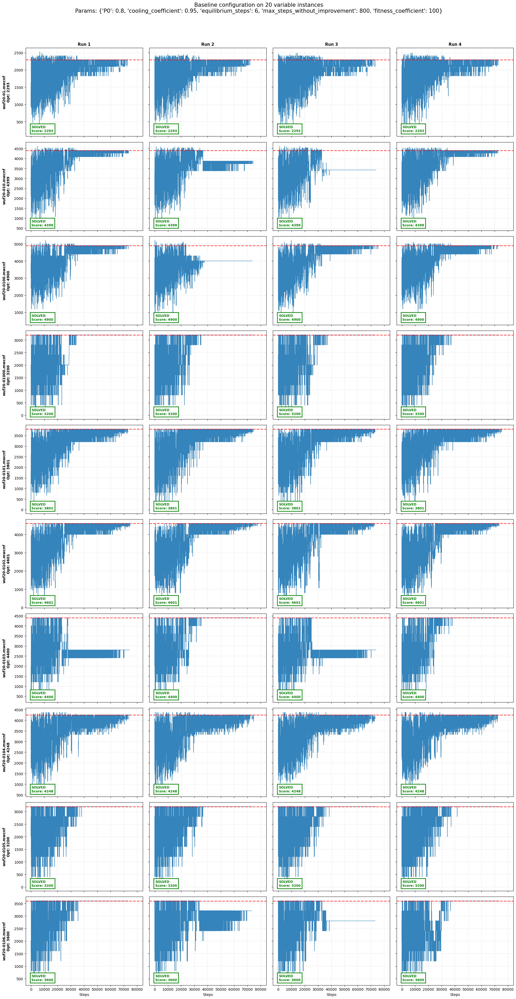


Instance                  | Runs | Solved | Optimal | Avg Score  | % of Opt | Avg Steps
-----------------------------------------------------------------------------------------------
wuf20-01.mwcnf            | 4    | 4      | 4       | 2293.0     | 100.00%  | 73300.5  
wuf20-010.mwcnf           | 4    | 4      | 4       | 4399.0     | 100.00%  | 73710.0  
wuf20-0100.mwcnf          | 4    | 4      | 4       | 4900.0     | 100.00%  | 74392.5  
wuf20-01000.mwcnf         | 4    | 4      | 4       | 3200.0     | 100.00%  | 73710.0  
wuf20-0101.mwcnf          | 4    | 4      | 4       | 3801.0     | 100.00%  | 74256.0  
wuf20-0102.mwcnf          | 4    | 4      | 4       | 4601.0     | 100.00%  | 75484.5  
wuf20-0103.mwcnf          | 4    | 4      | 4       | 4400.0     | 100.00%  | 73710.0  
wuf20-0104.mwcnf          | 4    | 4      | 4       | 4248.0     | 100.00%  | 73983.0  
wuf20-0105.mwcnf          | 4    | 4      | 4       | 3200.0     | 100.00%  | 74119.5  
wuf20-0106.mwcnf       

In [ ]:
results = evaluate_algorithm_performance(instance_paths_20,solutions_wuf_20_m,FINAL_CONFIG,4,"Baseline configuration on 20 variable instances")

# 75 proměnných

--- Starting Baseline configuration on 75 variable instances (40 total runs) ---
Params: {'P0': 0.8, 'cooling_coefficient': 0.95, 'equilibrium_steps': 6, 'max_steps_without_improvement': 800, 'fitness_coefficient': 100}
Processing Instance 1/10: wuf75-03.mwcnf
Processing Instance 2/10: wuf75-059.mwcnf
Processing Instance 3/10: wuf75-099.mwcnf
Processing Instance 4/10: wuf75-021.mwcnf
Processing Instance 5/10: wuf75-064.mwcnf
Processing Instance 6/10: wuf75-040.mwcnf
Processing Instance 7/10: wuf75-080.mwcnf
Processing Instance 8/10: wuf75-038.mwcnf
Processing Instance 9/10: wuf75-082.mwcnf
Processing Instance 10/10: wuf75-042.mwcnf


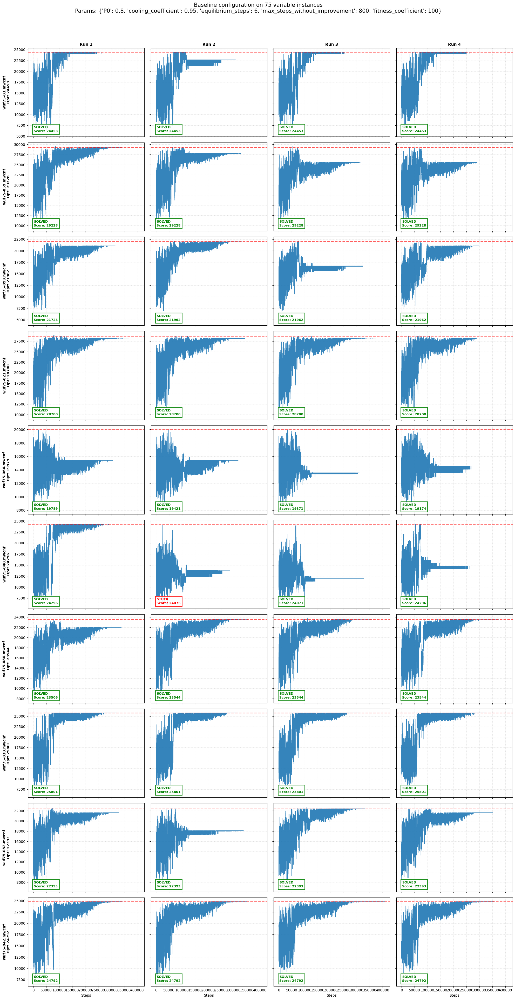


Instance                  | Runs | Solved | Optimal | Avg Score  | % of Opt | Avg Steps
-----------------------------------------------------------------------------------------------
wuf75-03.mwcnf            | 4    | 4      | 4       | 24453.0    | 100.00%  | 305662.5 
wuf75-059.mwcnf           | 4    | 4      | 4       | 29228.0    | 100.00%  | 317850.0 
wuf75-099.mwcnf           | 4    | 4      | 3       | 21902.2    | 99.73 %  | 324187.5 
wuf75-021.mwcnf           | 4    | 4      | 4       | 28700.0    | 100.00%  | 342712.5 
wuf75-064.mwcnf           | 4    | 4      | 0       | 19438.8    | 97.30 %  | 311512.5 
wuf75-040.mwcnf           | 4    | 3      | 2       | 24221.0    | 99.69 %  | 312000.0 
wuf75-080.mwcnf           | 4    | 4      | 3       | 23534.5    | 99.96 %  | 355875.0 
wuf75-038.mwcnf           | 4    | 4      | 4       | 25801.0    | 100.00%  | 318825.0 
wuf75-082.mwcnf           | 4    | 4      | 4       | 22393.0    | 100.00%  | 337350.0 
wuf75-042.mwcnf        

In [66]:
instance_paths_75 = [os.path.join(wuf_75_m_path,x) for x in os.listdir(wuf_75_m_path)[:10]]
solutions_wuf_75_m = get_solution_dict(os.path.join(wuf_75_path,"wuf75-325-M-opt.dat"))
results = evaluate_algorithm_performance(instance_paths_75,solutions_wuf_75_m,FINAL_CONFIG,4,"Baseline configuration on 75 variable instances")

# Jiné generování Vah

--- Starting  (40 total runs) ---
Params: {'P0': 0.8, 'cooling_coefficient': 0.95, 'equilibrium_steps': 6, 'max_steps_without_improvement': 800, 'fitness_coefficient': 100}
Processing Instance 1/10: wuf50-0323.mwcnf
Processing Instance 2/10: wuf50-0366.mwcnf
Processing Instance 3/10: wuf50-069.mwcnf
Processing Instance 4/10: wuf50-094.mwcnf
Processing Instance 5/10: wuf50-0861.mwcnf
Processing Instance 6/10: wuf50-0824.mwcnf
Processing Instance 7/10: wuf50-0657.mwcnf
Processing Instance 8/10: wuf50-0286.mwcnf
Processing Instance 9/10: wuf50-0612.mwcnf
Processing Instance 10/10: wuf50-0939.mwcnf


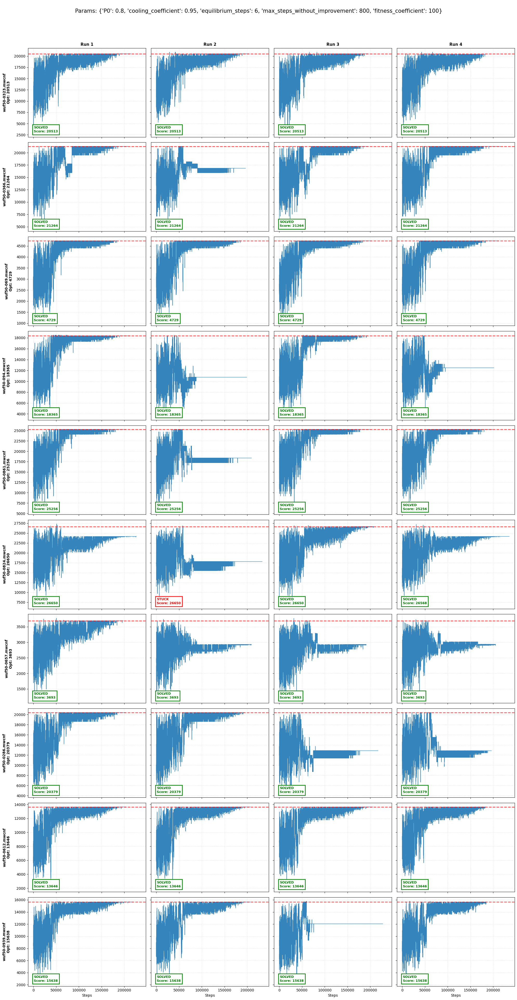


Instance                  | Runs | Solved | Optimal | Avg Score  | % of Opt | Avg Steps
-----------------------------------------------------------------------------------------------
wuf50-0323.mwcnf          | 4    | 4      | 4       | 20513.0    | 100.00%  | 199143.0 
wuf50-0366.mwcnf          | 4    | 4      | 4       | 21264.0    | 100.00%  | 204048.0 
wuf50-069.mwcnf           | 4    | 4      | 4       | 4729.0     | 100.00%  | 196527.0 
wuf50-094.mwcnf           | 4    | 4      | 4       | 18365.0    | 100.00%  | 201759.0 
wuf50-0861.mwcnf          | 4    | 4      | 4       | 25256.0    | 100.00%  | 203067.0 
wuf50-0824.mwcnf          | 4    | 3      | 2       | 26622.7    | 99.90 %  | 225630.0 
wuf50-0657.mwcnf          | 4    | 4      | 4       | 3693.0     | 100.00%  | 200778.0 
wuf50-0286.mwcnf          | 4    | 4      | 4       | 20379.0    | 100.00%  | 202413.0 
wuf50-0612.mwcnf          | 4    | 4      | 4       | 13646.0    | 100.00%  | 199797.0 
wuf50-0939.mwcnf       

In [69]:
instance_paths_50 = [os.path.join(wuf_50_m_path,x) for x in os.listdir(wuf_50_m_path)[:10]]
solutions_wuf_50_m = get_solution_dict(os.path.join(wuf_50_path,"wuf50-218-M-opt.dat"))
results = evaluate_algorithm_performance(instance_paths_50,solutions_wuf_50_m,FINAL_CONFIG,4,"")

--- Starting Baseline configuration on 50 variable instances (40 total runs) ---
Params: {'P0': 0.8, 'cooling_coefficient': 0.95, 'equilibrium_steps': 6, 'max_steps_without_improvement': 800, 'fitness_coefficient': 100}
Processing Instance 1/10: wuf50-0323.mwcnf
Processing Instance 2/10: wuf50-0366.mwcnf
Processing Instance 3/10: wuf50-069.mwcnf
Processing Instance 4/10: wuf50-094.mwcnf
Processing Instance 5/10: wuf50-0861.mwcnf
Processing Instance 6/10: wuf50-0824.mwcnf
Processing Instance 7/10: wuf50-0657.mwcnf
Processing Instance 8/10: wuf50-0286.mwcnf
Processing Instance 9/10: wuf50-0612.mwcnf
Processing Instance 10/10: wuf50-0939.mwcnf


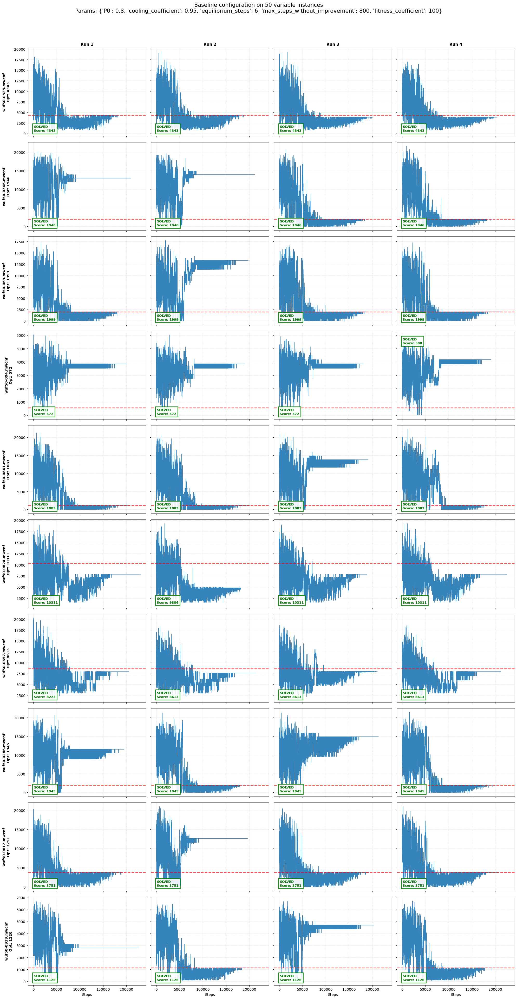


Instance                  | Runs | Solved | Optimal | Avg Score  | % of Opt | Avg Steps
-----------------------------------------------------------------------------------------------
wuf50-0323.mwcnf          | 4    | 4      | 4       | 4343.0     | 100.00%  | 195219.0 
wuf50-0366.mwcnf          | 4    | 4      | 4       | 1946.0     | 100.00%  | 203067.0 
wuf50-069.mwcnf           | 4    | 4      | 4       | 1999.0     | 100.00%  | 195219.0 
wuf50-094.mwcnf           | 4    | 4      | 3       | 556.0      | 97.20 %  | 190314.0 
wuf50-0861.mwcnf          | 4    | 4      | 4       | 1083.0     | 100.00%  | 194892.0 
wuf50-0824.mwcnf          | 4    | 4      | 3       | 10204.8    | 98.97 %  | 206337.0 
wuf50-0657.mwcnf          | 4    | 4      | 3       | 8515.5     | 98.87 %  | 210261.0 
wuf50-0286.mwcnf          | 4    | 4      | 4       | 1945.0     | 100.00%  | 207645.0 
wuf50-0612.mwcnf          | 4    | 4      | 4       | 3751.0     | 100.00%  | 196527.0 
wuf50-0939.mwcnf       

In [70]:

instance_paths_50_q = [os.path.join(wuf_50_q_path,x) for x in os.listdir(wuf_50_q_path)[:10]]
solutions_wuf_50_q = get_solution_dict(os.path.join(wuf_50_path,"wuf50-218-Q-opt.dat"))
results = evaluate_algorithm_performance(instance_paths_50_q,solutions_wuf_50_q,FINAL_CONFIG,4,"Baseline configuration on 50 variable instances")

# Blackbox Fáze

In [ ]:
.

SyntaxError: invalid syntax (1933637684.py, line 1)

In [ ]:
from worker_utils import run_blackbox_parallel

In [ ]:

instance_paths = [os.path.join(wuf_20_r_path,x) for x in os.listdir(wuf_20_r_path)]
solutions = get_solution_dict(os.path.join(wuf_20_path,"wuf20-91-R-opt.dat"))

df_results = run_blackbox_parallel(
    instance_paths=instance_paths,
    solutions_dict=solutions,
    params=FINAL_CONFIG,
    n_repeats=100,
    max_workers=10 # Uses all cores automatically
)
df_results.to_csv("wuf20-91-R")
display(df_results)

--- Starting Black Box Evaluation ---
Instances: 1000
Repeats per Instance: 100
Total Runs: 100000
Parallel Workers: 10
Completed 1/1000 instances...
Completed 2/1000 instances...
Completed 3/1000 instances...
Completed 4/1000 instances...
Completed 5/1000 instances...
Completed 6/1000 instances...
Completed 7/1000 instances...
Completed 8/1000 instances...
Completed 9/1000 instances...
Completed 10/1000 instances...
Completed 11/1000 instances...
Completed 12/1000 instances...
Completed 13/1000 instances...
Completed 14/1000 instances...
Completed 15/1000 instances...
Completed 16/1000 instances...
Completed 17/1000 instances...
Completed 18/1000 instances...
Completed 19/1000 instances...
Completed 20/1000 instances...
Completed 21/1000 instances...
Completed 22/1000 instances...
Completed 23/1000 instances...
Completed 24/1000 instances...
Completed 25/1000 instances...
Completed 26/1000 instances...
Completed 27/1000 instances...
Completed 28/1000 instances...
Completed 29/1000 ins

,Instance,Is_Valid,Success,Score,Optimum,Rel_Error,Steps,Time
0,wuf20-0911.mwcnf,True,True,23689,23689,0.0,73528,0.383580
1,wuf20-0911.mwcnf,True,True,23689,23689,0.0,73528,0.377607
2,wuf20-0911.mwcnf,True,True,23689,23689,0.0,74256,0.400077
3,wuf20-0911.mwcnf,True,True,23689,23689,0.0,73528,0.378433
4,wuf20-0911.mwcnf,True,True,23689,23689,0.0,73528,0.372999
...,...,...,...,...,...,...,...,...
99995,wuf20-0572.mwcnf,True,True,3049,3049,0.0,73528,0.360067
99996,wuf20-0572.mwcnf,True,True,3049,3049,0.0,75712,0.417707
99997,wuf20-0572.mwcnf,True,True,3049,3049,0.0,77168,0.426511
99998,wuf20-0572.mwcnf,True,True,3049,3049,0.0,74256,0.361302


In [ ]:
instance_paths = [os.path.join(wuf_20_m_path,x) for x in os.listdir(wuf_20_m_path)]
solutions = get_solution_dict(os.path.join(wuf_20_path,"wuf20-91-M-opt.dat"))

df_results = run_blackbox_parallel(
    instance_paths=instance_paths,
    solutions_dict=solutions,
    params=FINAL_CONFIG,
    n_repeats=100,
    max_workers=12 # Uses all cores automatically
)
df_results.to_csv("wuf20-91-M")
display(df_results)

--- Starting Black Box Evaluation ---
Instances: 1000
Repeats per Instance: 100
Total Runs: 100000
Parallel Workers: 12
Completed 1/1000 instances...
Completed 2/1000 instances...
Completed 3/1000 instances...
Completed 4/1000 instances...
Completed 5/1000 instances...
Completed 6/1000 instances...
Completed 7/1000 instances...
Completed 8/1000 instances...
Completed 9/1000 instances...
Completed 10/1000 instances...
Completed 11/1000 instances...
Completed 12/1000 instances...
Completed 13/1000 instances...
Completed 14/1000 instances...
Completed 15/1000 instances...
Completed 16/1000 instances...
Completed 17/1000 instances...
Completed 18/1000 instances...
Completed 19/1000 instances...
Completed 20/1000 instances...
Completed 21/1000 instances...
Completed 22/1000 instances...
Completed 23/1000 instances...
Completed 24/1000 instances...
Completed 25/1000 instances...
Completed 26/1000 instances...
Completed 27/1000 instances...
Completed 28/1000 instances...
Completed 29/1000 ins

,Instance,Is_Valid,Success,Score,Optimum,Rel_Error,Steps,Time
0,wuf20-0911.mwcnf,True,True,6638,6638,0.0,73528,0.394691
1,wuf20-0911.mwcnf,True,True,6638,6638,0.0,73528,0.548268
2,wuf20-0911.mwcnf,True,True,6638,6638,0.0,73528,0.445367
3,wuf20-0911.mwcnf,True,True,6638,6638,0.0,73528,0.449494
4,wuf20-0911.mwcnf,True,True,6638,6638,0.0,73528,0.444634
...,...,...,...,...,...,...,...,...
99995,wuf20-0572.mwcnf,True,True,3477,3477,0.0,74984,0.354437
99996,wuf20-0572.mwcnf,True,True,3477,3477,0.0,73528,0.398175
99997,wuf20-0572.mwcnf,True,True,3477,3477,0.0,73528,0.349683
99998,wuf20-0572.mwcnf,True,True,3477,3477,0.0,74256,0.347553


In [ ]:
instance_paths = [os.path.join(wuf_20_q_path,x) for x in os.listdir(wuf_20_q_path)]
solutions = get_solution_dict(os.path.join(wuf_20_path,"wuf20-91-Q-opt.dat"))

df_results = run_blackbox_parallel(
    instance_paths=instance_paths,
    solutions_dict=solutions,
    params=FINAL_CONFIG,
    n_repeats=100,
    max_workers=12 # Uses all cores automatically
)
df_results.to_csv("wuf20-91-Q")
display(df_results)

--- Starting Black Box Evaluation ---
Instances: 1000
Repeats per Instance: 100
Total Runs: 100000
Parallel Workers: 12
Completed 1/1000 instances...
Completed 2/1000 instances...
Completed 3/1000 instances...
Completed 4/1000 instances...
Completed 5/1000 instances...
Completed 6/1000 instances...
Completed 7/1000 instances...
Completed 8/1000 instances...
Completed 9/1000 instances...
Completed 10/1000 instances...
Completed 11/1000 instances...
Completed 12/1000 instances...
Completed 13/1000 instances...
Completed 14/1000 instances...
Completed 15/1000 instances...
Completed 16/1000 instances...
Completed 17/1000 instances...
Completed 18/1000 instances...
Completed 19/1000 instances...
Completed 20/1000 instances...
Completed 21/1000 instances...
Completed 22/1000 instances...
Completed 23/1000 instances...
Completed 24/1000 instances...
Completed 25/1000 instances...
Completed 26/1000 instances...
Completed 27/1000 instances...
Completed 28/1000 instances...
Completed 29/1000 ins

,Instance,Is_Valid,Success,Score,Optimum,Rel_Error,Steps,Time
0,wuf20-0911.mwcnf,True,True,2247,2247,0.0,73528,0.446847
1,wuf20-0911.mwcnf,True,True,2247,2247,0.0,74256,0.433554
2,wuf20-0911.mwcnf,True,True,2247,2247,0.0,75712,0.460243
3,wuf20-0911.mwcnf,True,True,2247,2247,0.0,73528,0.439297
4,wuf20-0911.mwcnf,True,True,2247,2247,0.0,73528,0.423190
...,...,...,...,...,...,...,...,...
99995,wuf20-0537.mwcnf,True,True,417,417,0.0,73528,0.334339
99996,wuf20-0537.mwcnf,True,True,417,417,0.0,74984,0.338266
99997,wuf20-0537.mwcnf,True,True,417,417,0.0,74256,0.332106
99998,wuf20-0537.mwcnf,True,True,417,417,0.0,74256,0.348992


In [ ]:
instance_paths = [os.path.join(wuf_20_n_path,x) for x in os.listdir(wuf_20_n_path)]
solutions = get_solution_dict(os.path.join(wuf_20_path,"wuf20-91-N-opt.dat"))

df_results = run_blackbox_parallel(
    instance_paths=instance_paths,
    solutions_dict=solutions,
    params=FINAL_CONFIG,
    n_repeats=100,
    max_workers=12 # Uses all cores automatically
)
df_results.to_csv("wuf20-91-N")
display(df_results)

--- Starting Black Box Evaluation ---
Instances: 1000
Repeats per Instance: 100
Total Runs: 100000
Parallel Workers: 12
Completed 1/1000 instances...
Completed 2/1000 instances...
Completed 3/1000 instances...
Completed 4/1000 instances...
Completed 5/1000 instances...
Completed 6/1000 instances...
Completed 7/1000 instances...
Completed 8/1000 instances...
Completed 9/1000 instances...
Completed 10/1000 instances...
Completed 11/1000 instances...
Completed 12/1000 instances...
Completed 13/1000 instances...
Completed 14/1000 instances...
Completed 15/1000 instances...
Completed 16/1000 instances...
Completed 17/1000 instances...
Completed 18/1000 instances...
Completed 19/1000 instances...
Completed 20/1000 instances...
Completed 21/1000 instances...
Completed 22/1000 instances...
Completed 23/1000 instances...
Completed 24/1000 instances...
Completed 25/1000 instances...
Completed 26/1000 instances...
Completed 27/1000 instances...
Completed 28/1000 instances...
Completed 29/1000 ins

,Instance,Is_Valid,Success,Score,Optimum,Rel_Error,Steps,Time
0,wuf20-0911.mwcnf,True,True,52276,52276,0.0,73528,0.433480
1,wuf20-0911.mwcnf,True,True,52276,52276,0.0,73528,0.471480
2,wuf20-0911.mwcnf,True,True,52276,52276,0.0,73528,0.432558
3,wuf20-0911.mwcnf,True,True,52276,52276,0.0,73528,0.435537
4,wuf20-0911.mwcnf,True,True,52276,52276,0.0,73528,0.414869
...,...,...,...,...,...,...,...,...
99995,wuf20-0537.mwcnf,True,True,18167,18167,0.0,73528,0.331277
99996,wuf20-0537.mwcnf,True,True,18167,18167,0.0,73528,0.332314
99997,wuf20-0537.mwcnf,True,True,18167,18167,0.0,74256,0.333755
99998,wuf20-0537.mwcnf,True,True,18167,18167,0.0,74256,0.333068


In [ ]:
instance_paths = [os.path.join(wuf_50_n_path,x) for x in os.listdir(wuf_50_n_path)]
solutions = get_solution_dict(os.path.join(wuf_50_path,"wuf50-218-N-opt.dat"))

df_results = run_blackbox_parallel(
    instance_paths=instance_paths,
    solutions_dict=solutions,
    params=FINAL_CONFIG,
    n_repeats=100,
    max_workers=12 # Uses all cores automatically
)
df_results.to_csv("wuf-50-218-N")
display(df_results)

--- Starting Black Box Evaluation ---
Instances: 1000
Repeats per Instance: 100
Total Runs: 100000
Parallel Workers: 12
Completed 1/1000 instances...
Completed 2/1000 instances...
Completed 3/1000 instances...
Completed 4/1000 instances...
Completed 5/1000 instances...
Completed 6/1000 instances...
Completed 7/1000 instances...
Completed 8/1000 instances...
Completed 9/1000 instances...
Completed 10/1000 instances...
Completed 11/1000 instances...
Completed 12/1000 instances...
Completed 13/1000 instances...
Completed 14/1000 instances...
Completed 15/1000 instances...
Completed 16/1000 instances...
Completed 17/1000 instances...
Completed 18/1000 instances...
Completed 19/1000 instances...
Completed 20/1000 instances...
Completed 21/1000 instances...
Completed 22/1000 instances...
Completed 23/1000 instances...
Completed 24/1000 instances...
Completed 25/1000 instances...
Completed 26/1000 instances...
Completed 27/1000 instances...
Completed 28/1000 instances...
Completed 29/1000 ins

,Instance,Is_Valid,Success,Score,Optimum,Rel_Error,Steps,Time
0,wuf50-0556.mwcnf,True,True,256073,256073,0.0,176144,1.183171
1,wuf50-0556.mwcnf,True,True,256073,256073,0.0,186608,1.143567
2,wuf50-0556.mwcnf,True,True,256073,256073,0.0,202304,1.302799
3,wuf50-0556.mwcnf,True,True,256073,256073,0.0,184864,1.212153
4,wuf50-0556.mwcnf,True,True,256073,256073,0.0,176144,1.074071
...,...,...,...,...,...,...,...,...
99995,wuf50-0277.mwcnf,True,True,259292,259292,0.0,197072,0.941950
99996,wuf50-0277.mwcnf,True,True,259292,259292,0.0,214512,1.034257
99997,wuf50-0277.mwcnf,True,True,259292,259292,0.0,207536,0.978449
99998,wuf50-0277.mwcnf,True,True,259292,259292,0.0,224976,1.062096


In [ ]:
instance_paths = [os.path.join(wuf_50_r_path,x) for x in os.listdir(wuf_50_r_path)]
solutions = get_solution_dict(os.path.join(wuf_50_path,"wuf50-218-R-opt.dat"))

df_results = run_blackbox_parallel(
    instance_paths=instance_paths,
    solutions_dict=solutions,
    params=FINAL_CONFIG,
    n_repeats=100,
    max_workers=12 # Uses all cores automatically
)
df_results.to_csv("wuf-50-218-R")

--- Starting Black Box Evaluation ---
Instances: 1000
Repeats per Instance: 100
Total Runs: 100000
Parallel Workers: 12
Completed 1/1000 instances...
Completed 2/1000 instances...
Completed 3/1000 instances...
Completed 4/1000 instances...
Completed 5/1000 instances...
Completed 6/1000 instances...
Completed 7/1000 instances...
Completed 8/1000 instances...
Completed 9/1000 instances...
Completed 10/1000 instances...
Completed 11/1000 instances...
Completed 12/1000 instances...
Completed 13/1000 instances...
Completed 14/1000 instances...
Completed 15/1000 instances...
Completed 16/1000 instances...
Completed 17/1000 instances...
Completed 18/1000 instances...
Completed 19/1000 instances...
Completed 20/1000 instances...
Completed 21/1000 instances...
Completed 22/1000 instances...
Completed 23/1000 instances...
Completed 24/1000 instances...
Completed 25/1000 instances...
Completed 26/1000 instances...
Completed 27/1000 instances...
Completed 28/1000 instances...
Completed 29/1000 ins

In [ ]:
instance_paths = [os.path.join(wuf_50_m_path,x) for x in os.listdir(wuf_50_m_path)]
solutions = get_solution_dict(os.path.join(wuf_50_path,"wuf50-218-M-opt.dat"))

df_results = run_blackbox_parallel(
    instance_paths=instance_paths,
    solutions_dict=solutions,
    params=FINAL_CONFIG,
    n_repeats=100,
    max_workers=12 # Uses all cores automatically
)
df_results.to_csv("wuf-50-218-M")
display(df_results)
print(df_results["Rel_Error"].mean())

--- Starting Black Box Evaluation ---
Instances: 1000
Repeats per Instance: 100
Total Runs: 100000
Parallel Workers: 12
Completed 1/1000 instances...
Completed 2/1000 instances...
Completed 3/1000 instances...
Completed 4/1000 instances...
Completed 5/1000 instances...
Completed 6/1000 instances...
Completed 7/1000 instances...
Completed 8/1000 instances...
Completed 9/1000 instances...
Completed 10/1000 instances...
Completed 11/1000 instances...
Completed 12/1000 instances...
Completed 13/1000 instances...
Completed 14/1000 instances...
Completed 15/1000 instances...
Completed 16/1000 instances...
Completed 17/1000 instances...
Completed 18/1000 instances...
Completed 19/1000 instances...
Completed 20/1000 instances...
Completed 21/1000 instances...
Completed 22/1000 instances...
Completed 23/1000 instances...
Completed 24/1000 instances...
Completed 25/1000 instances...
Completed 26/1000 instances...
Completed 27/1000 instances...
Completed 28/1000 instances...
Completed 29/1000 ins

,Instance,Is_Valid,Success,Score,Optimum,Rel_Error,Steps,Time
0,wuf50-0286.mwcnf,True,True,20379,20379,0.0,188352,1.148536
1,wuf50-0286.mwcnf,True,True,20379,20379,0.0,176144,1.040327
2,wuf50-0286.mwcnf,True,True,20379,20379,0.0,218000,1.316045
3,wuf50-0286.mwcnf,True,True,20379,20379,0.0,198816,1.202231
4,wuf50-0286.mwcnf,True,True,20379,20379,0.0,212768,1.101906
...,...,...,...,...,...,...,...,...
99995,wuf50-0277.mwcnf,True,True,19728,19728,0.0,223232,1.019140
99996,wuf50-0277.mwcnf,True,True,19728,19728,0.0,218000,1.039043
99997,wuf50-0277.mwcnf,True,True,19728,19728,0.0,216256,1.031183
99998,wuf50-0277.mwcnf,True,True,19728,19728,0.0,211024,0.976260


0.008190077557986793


In [ ]:
instance_paths = [os.path.join(wuf_50_q_path,x) for x in os.listdir(wuf_50_q_path)]
solutions = get_solution_dict(os.path.join(wuf_50_path,"wuf50-218-Q-opt.dat"))

df_results = run_blackbox_parallel(
    instance_paths=instance_paths,
    solutions_dict=solutions,
    params=FINAL_CONFIG,
    n_repeats=100,
    max_workers=11
)
df_results.to_csv("wuf-50-218-Q")
display(df_results)

--- Starting Black Box Evaluation ---
Instances: 1000
Repeats per Instance: 100
Total Runs: 100000
Parallel Workers: 11
Completed 1/1000 instances...
Completed 2/1000 instances...
Completed 3/1000 instances...
Completed 4/1000 instances...
Completed 5/1000 instances...
Completed 6/1000 instances...
Completed 7/1000 instances...
Completed 8/1000 instances...
Completed 9/1000 instances...
Completed 10/1000 instances...
Completed 11/1000 instances...
Completed 12/1000 instances...
Completed 13/1000 instances...


In [ ]:
instance_paths = [os.path.join(wuf_75_q_path,x) for x in os.listdir(wuf_75_q_path)]
solutions = get_solution_dict(os.path.join(wuf_75_path,"wuf75-325-Q-opt.dat"))

df_results = run_blackbox_parallel(
    instance_paths=instance_paths,
    solutions_dict=solutions,
    params=FINAL_CONFIG,
    n_repeats=50,
    max_workers=11 # Uses all cores automatically
)
df_results.to_csv("wuf-75-325-Q")
display(df_results)

--- Starting Black Box Evaluation ---
Instances: 100
Repeats per Instance: 50
Total Runs: 5000
Parallel Workers: 11


In [ ]:
instance_paths = [os.path.join(wuf_75_m_path,x) for x in os.listdir(wuf_75_m_path)]
solutions = get_solution_dict(os.path.join(wuf_75_path,"wuf75-325-M-opt.dat"))

df_results = run_blackbox_parallel(
    instance_paths=instance_paths,
    solutions_dict=solutions,
    params=FINAL_CONFIG,
    n_repeats=50,
    max_workers=11 # Uses all cores automatically
)
df_results.to_csv("wuf-75-325-M")
display(df_results)
print(df_results['Rel_Error'].mean())
print(df_results['Success'].sum())

--- Starting Black Box Evaluation ---
Instances: 100
Repeats per Instance: 20
Total Runs: 2000
Parallel Workers: 12
Completed 1/100 instances...
Completed 2/100 instances...
Completed 3/100 instances...
Completed 4/100 instances...
Completed 5/100 instances...
Completed 6/100 instances...
Completed 7/100 instances...
Completed 8/100 instances...
Completed 9/100 instances...
Completed 10/100 instances...
Completed 11/100 instances...
Completed 12/100 instances...
Completed 13/100 instances...
Completed 14/100 instances...
Completed 15/100 instances...
Completed 16/100 instances...
Completed 17/100 instances...
Completed 18/100 instances...
Completed 19/100 instances...
Completed 20/100 instances...
Completed 21/100 instances...
Completed 22/100 instances...
Completed 23/100 instances...
Completed 24/100 instances...
Completed 25/100 instances...
Completed 26/100 instances...
Completed 27/100 instances...
Completed 28/100 instances...
Completed 29/100 instances...
Completed 30/100 instan

,Instance,Success,Score,Optimum,Rel_Error,Steps,Time
0,wuf75-03.mwcnf,True,24453,24453,0.000000,214800,1.326056
1,wuf75-03.mwcnf,True,24453,24453,0.000000,216600,1.320075
2,wuf75-03.mwcnf,True,24453,24453,0.000000,223800,1.366110
3,wuf75-03.mwcnf,True,24453,24453,0.000000,214500,1.289507
4,wuf75-03.mwcnf,True,24453,24453,0.000000,212100,1.315245
...,...,...,...,...,...,...,...
1995,wuf75-010.mwcnf,True,18638,18638,0.000000,267900,1.247617
1996,wuf75-010.mwcnf,False,18622,18638,0.000858,248700,1.151293
1997,wuf75-010.mwcnf,False,18636,18638,0.000107,228900,1.036679
1998,wuf75-010.mwcnf,True,18638,18638,0.000000,262500,1.190311


0.015575153704304606
1527


In [ ]:
instance_paths = [os.path.join(wuf_75_r_path,x) for x in os.listdir(wuf_75_r_path)]
solutions = get_solution_dict(os.path.join(wuf_75_path,"wuf75-325-R-opt.dat"))

df_results = run_blackbox_parallel(
    instance_paths=instance_paths,
    solutions_dict=solutions,
    params=FINAL_CONFIG,
    n_repeats=50,
    max_workers=11 # Uses all cores automatically
)
df_results.to_csv("wuf-75-325-R")
display(df_results)
print(df_results['Rel_Error'].mean())
print(df_results['Success'].sum())
print(df_results["Is_Valid"].sum())

In [ ]:
instance_paths = [os.path.join(wuf_75_n_path,x) for x in os.listdir(wuf_75_n_path)]
solutions = get_solution_dict(os.path.join(wuf_75_path,"wuf75-325-N-opt.dat"))

df_results = run_blackbox_parallel(
    instance_paths=instance_paths,
    solutions_dict=solutions,
    params=FINAL_CONFIG,
    n_repeats=50,
    max_workers=11 # Uses all cores automatically
)
df_results.to_csv("wuf-75-325-N")
display(df_results)